<a href="https://colab.research.google.com/github/yuval105/data-science-project/blob/build_map_data/exterior_classifer/exterior_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
%cd /content/
# Clone the entire repo.
!pip install torch==1.4.0 torchvision==0.5.0
%cd data-science-project

/content
/content/data-science-project


Download the exterior classifier data

In [10]:
from utils.image_downloader import download_image_dataset
download_image_dataset('exterior_classifer/urls','exterior_classifer/images',8)

In [11]:
from fastai.vision import *
tfms = get_transforms(do_flip=True)
data = ImageList.from_folder('exterior_classifer/images/').split_by_rand_pct(0.2).label_from_folder().transform(tfms, size=224).databunch().normalize(imagenet_stats)

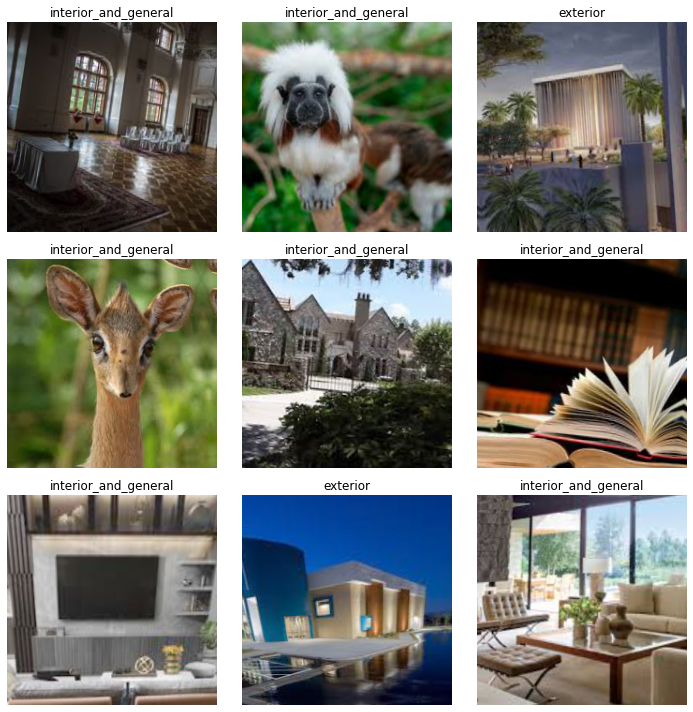

In [12]:
data.show_batch(rows=3,figsize=(10,10))

Run 10 epochs on the data with resnet18 backbone.

In [16]:
learn = cnn_learner(data, models.resnet18, metrics=accuracy)
learn.fit_one_cycle(10,1e-2)
learn.save('exterior_classifer')

epoch,train_loss,valid_loss,accuracy,time
0,0.486102,0.451260,0.920635,00:13
1,0.285232,0.363429,0.949206,00:13
2,0.182398,0.210439,0.971429,00:13
3,0.150577,0.305081,0.955556,00:13
4,0.119514,0.256048,0.952381,00:13
5,0.101190,0.172489,0.968254,00:13
6,0.077376,0.178982,0.974603,00:13
7,0.067343,0.225787,0.965079,00:13
8,0.052299,0.238514,0.961905,00:13
9,0.045964,0.239164,0.961905,00:13


Lets ee the results on the validataion test

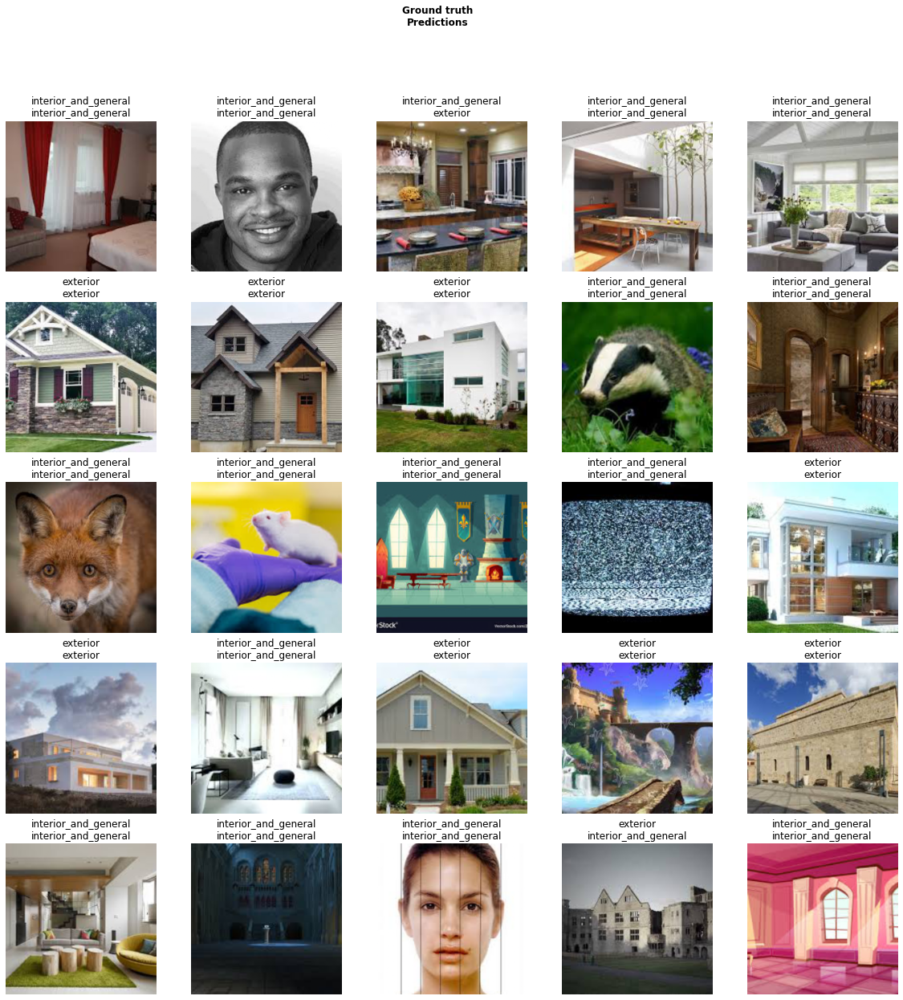

In [ ]:
learn.show_results(DatasetType.Valid)

Now we will test the model on the arch urls dataset

In [ ]:
download_image_dataset('data/urls','data/images',24)

data/urls/ancient greek/images.txt already downloaded
data/urls/colonial/french colonial/images.txt already downloaded
data/urls/colonial/spanish colonial/images.txt already downloaded
data/urls/colonial/german colonial/images.txt already downloaded
data/urls/colonial/portugese colonial/images.txt already downloaded
data/urls/colonial/american colonial/colonial georgian/images.txt already downloaded
data/urls/colonial/american colonial/mid atlantic colonial/images.txt already downloaded
data/urls/colonial/american colonial/dutch colonial/images.txt already downloaded
data/urls/ancient india/images.txt already downloaded
data/urls/byzantine/images.txt already downloaded
data/urls/neoclassical/georgian/images.txt already downloaded
data/urls/neoclassical/neoclassical/iamges.txt already downloaded
data/urls/neoclassical/victorian/images.txt already downloaded
data/urls/neoclassical/Beuax-arts/images.txt already downloaded
data/urls/roman/images.txt already downloaded
data/urls/modern/art 

Let the model predict on the test dataset

In [ ]:
data_archs = ImageList.from_folder('data/images/')
learn.data.add_test(data_archs)

In [ ]:
preds = learn.get_preds(DatasetType.Test)


Plot some mixed results

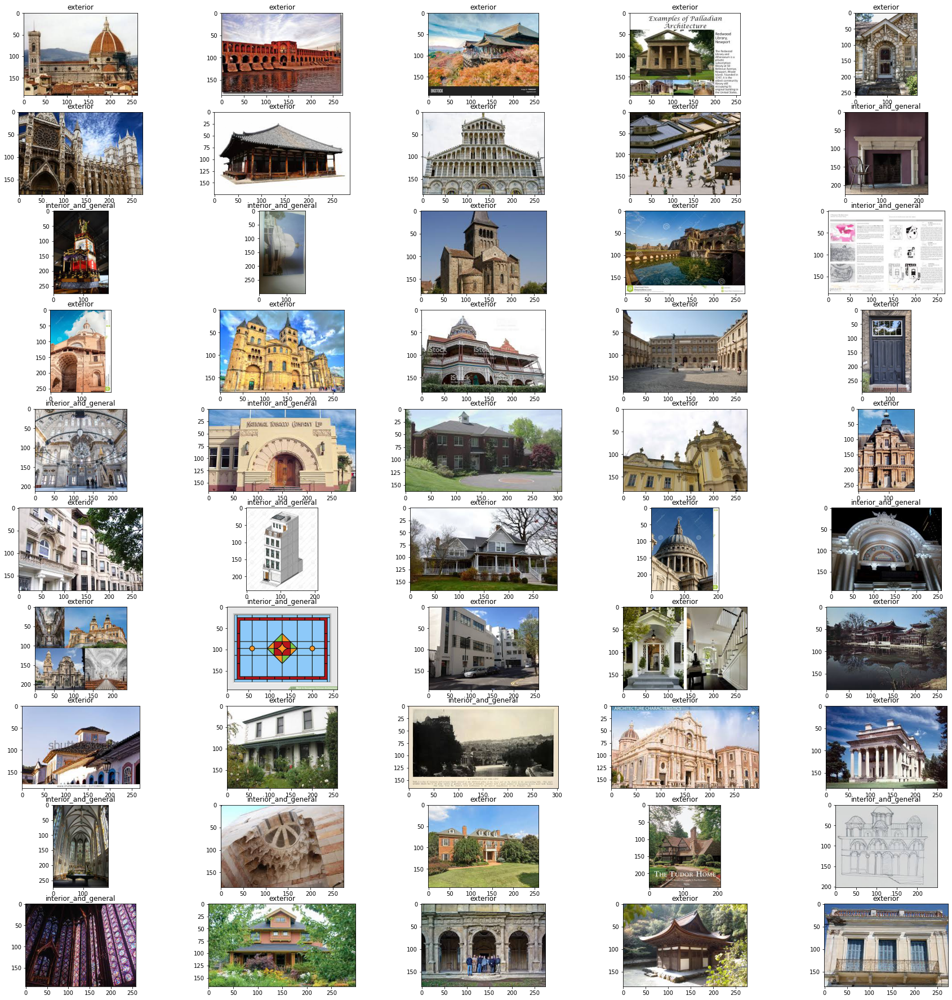

In [ ]:
import matplotlib.pyplot as plt
import random

rows,cols = 10,5

fig,axes = plt.subplots(rows,cols,figsize=(8,8))

plt.subplots_adjust(0,0,3,3)

for i in range(rows):
  for j in range(cols):
    image_idx = random.randint(0,len(data_archs))
    label = preds[0][image_idx].argmax()
    axes[i,j].imshow(data_archs[image_idx].data.permute(1,2,0))
    axes[i,j].set_title(data.classes[label])

Plot only interior results

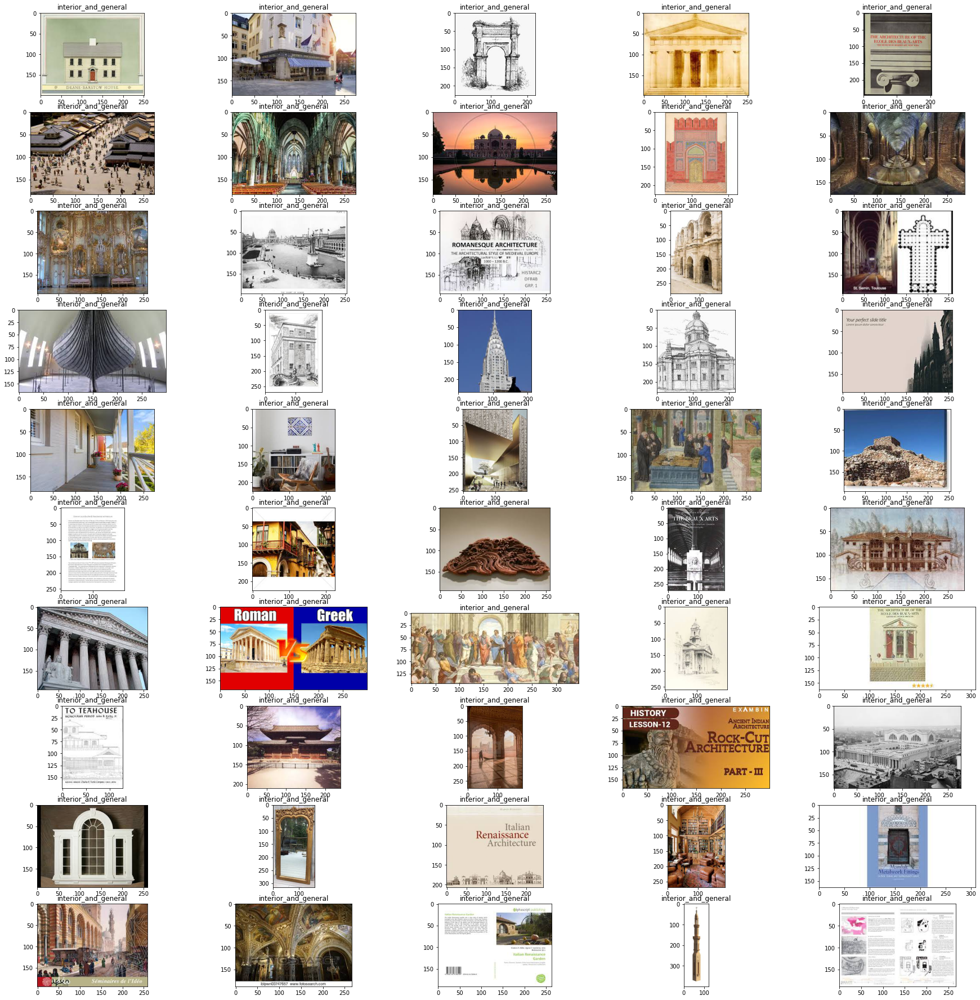

In [ ]:
interior = preds[0].argmax(dim=1).nonzero()
rows,cols = 10,5

fig,axes = plt.subplots(rows,cols,figsize=(8,8))

plt.subplots_adjust(0,0,3,3)

for i in range(rows):
  for j in range(cols):
    image_idx = interior[random.randint(0,interior.shape[0])].item()
    label = preds[0][image_idx].argmax()
    axes[i,j].imshow(data_archs[image_idx].data.permute(1,2,0))
    axes[i,j].set_title(data.classes[label])

Plot only Exterior results

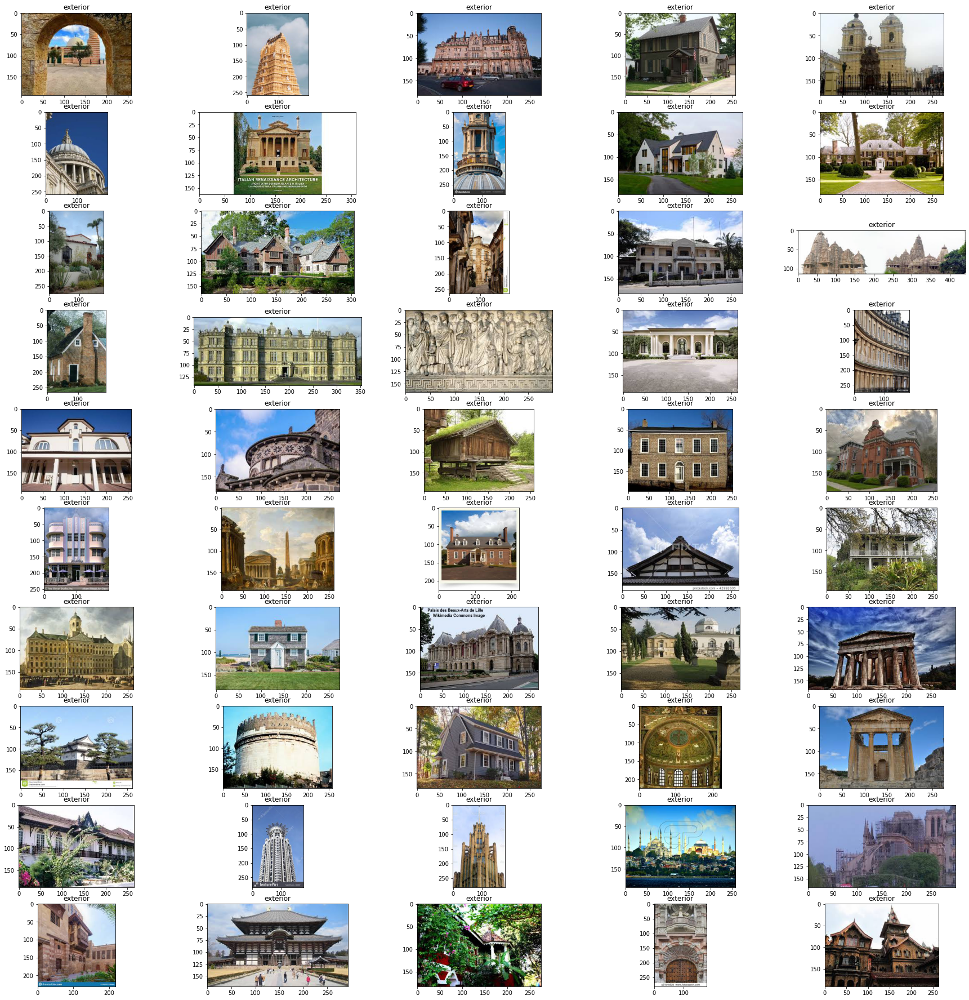

In [ ]:
exterior = (preds[0].argmax(dim=1)==0).nonzero()
rows,cols = 10,5

fig,axes = plt.subplots(rows,cols,figsize=(8,8))

plt.subplots_adjust(0,0,3,3)

for i in range(rows):
  for j in range(cols):
    image_idx = exterior[random.randint(0,exterior.shape[0])].item()
    label = preds[0][image_idx].argmax()
    axes[i,j].imshow(data_archs[image_idx].data.permute(1,2,0))
    axes[i,j].set_title(data.classes[label])